# Assignment 1

## A bit of info before you start.


> ***First and foremost, dont use AI to code. Use it to understand and then write code yourself. Use AI to verify if the code you wrote it correct, that will help you learn far far more.***

> ***Implement Stuff from sratch. Use cv2 functions only when numpy implementation can be extremely tedious.***



You will need to use your own image for this assignment, which you need to import into here.
If you cant fetch your image from any APIs that dont need credentials, then :
To preserve an image in Google Colab without a continuous runtime or using Google Drive, you can use base64 string encoding of images ( its really simple )

First, begin by normally uploading the image into the contents folders as you normally do in colab or fetch it using Drive or any API.

To get the base64 string :
```
import base64
with open("your_image.jpg", "rb") as img_file:
    print(base64.b64encode(img_file.read()).decode())
```

Note that the base64 string is a very long string, click on the three dot icon to the left of the current code cell and click on <code> Copy Cell Output </code> to easily copy it to your clipboard.

Then, to embed the string into your Jupyter Notebook :
```
from PIL import Image
import io
import base64
import matplotlib.pyplot as plt
import numpy as np

# PASTE BASE64 STRING HERE
base64_image = "iVBORw0K..."  # long base64 string

img_data = base64.b64decode(base64_image)
img = Image.open(io.BytesIO(img_data))

plt.imshow(img)
plt.axis("off")
```
The string is really long so, use a multiline string in python ( syntax : """ """ )

Otherwise, you can also choose to use any API ( try researching on https://picsum.photos/ )

## Part A

### Load your image

1. Display it in RGB

2. Convert to grayscale ( use NumPy to calculate aggregates using the weighted sum formula )

3. Use the cvtColor function to do the same and compare results

3. Print the array shapes of both the RGB and grayscale images

4. Print a few pixel values of both

( Do you notice the difference that number of channels created on the array shape ?? )

In [ ]:
# Your PART A codes follow here. You can create more cells under this. Write clean and commented code.

In [35]:
#importing our image
import numpy as np
import cv2
import matplotlib.pyplot as plt

img = cv2.imread("image.jpg")

(np.float64(-0.5), np.float64(5183.5), np.float64(3887.5), np.float64(-0.5))

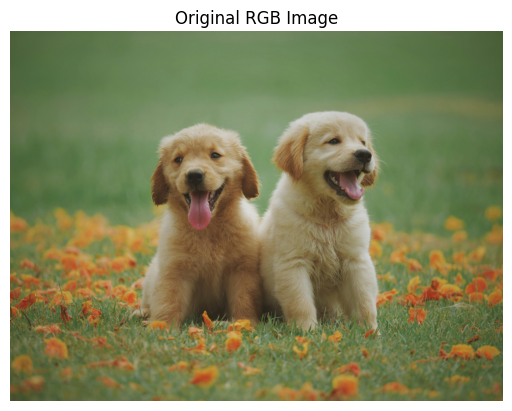

In [ ]:
#Displaying it in RGB
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

plt.imshow(img_rgb)
plt.title("Original RGB Image")
plt.axis("off")

(np.float64(-0.5), np.float64(5183.5), np.float64(3887.5), np.float64(-0.5))

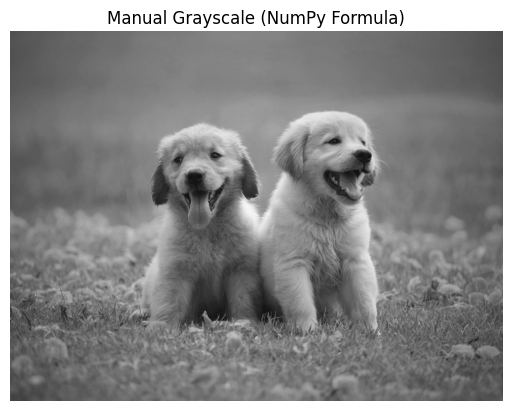

In [ ]:
# Extract R, G, B channels from the RGB version
R = img_rgb[:, :, 0]
G = img_rgb[:, :, 1]
B = img_rgb[:, :, 2]

# Weighted grayscale conversion
gray_manual = (0.299 * R + 0.587 * G + 0.114 * B).astype(np.uint8)

plt.imshow(gray_manual, cmap="gray")
plt.title("Manual Grayscale (NumPy Formula)")
plt.axis("off")

(np.float64(-0.5), np.float64(5183.5), np.float64(3887.5), np.float64(-0.5))

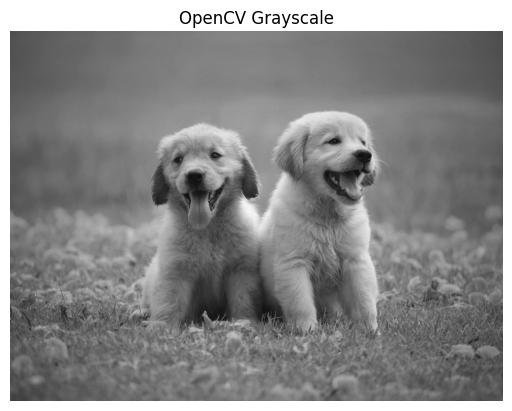

In [ ]:
#Grayscale using openCV
gray_cv = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)

plt.imshow(gray_cv, cmap="gray")
plt.title("OpenCV Grayscale")
plt.axis("off")

In [ ]:
#Comparing shapes of RGB, Grayscale using numpy and Grayscale using cv
print("RGB Image Shape            :", img_rgb.shape)
print("Manual Grayscale Shape     :", gray_manual.shape)
print("OpenCV Grayscale Shape     :", gray_cv.shape)

RGB Image Shape            : (3888, 5184, 3)
Manual Grayscale Shape     : (3888, 5184)
OpenCV Grayscale Shape     : (3888, 5184)


In [ ]:
# Picking up a random middle pixel for comparison
h, w = gray_manual.shape
sample_pixel = (h//2, w//2)

print("\nSample Pixel Coordinates:", sample_pixel)
print("RGB Pixel:", img_rgb[sample_pixel])
print("Manual Grayscale Pixel:", gray_manual[sample_pixel])
print("OpenCV Grayscale Pixel:", gray_cv[sample_pixel])



Sample Pixel Coordinates: (1944, 2592)
RGB Pixel: [214 215 201]
Manual Grayscale Pixel: 213
OpenCV Grayscale Pixel: 213


## Part B
### B1. Compute the FFT of the grayscale image ( use NumPy )
Steps:
1. <code>np.fft.fft2</code>
2. <code>np.fft.fftshift</code>
3. Store as <code>fshift</code>

### B2. Compute magnitude, phase and display Magnitude Spectrum

In [ ]:
# Your PART B codes follow here. You can create more cells under this. Write clean and commented code.

In [ ]:
# Convert to float
gray_float = gray_manual.astype(np.float32)

# 2D Fourier Transform
f = np.fft.fft2(gray_float)

# Shift low frequencies to the center
fshift = np.fft.fftshift(f)

In [ ]:
# Magnitude Spectrum
magnitude = np.abs(fshift)

# Phase Spectrum
phase = np.angle(fshift)

(np.float64(-0.5), np.float64(5183.5), np.float64(3887.5), np.float64(-0.5))

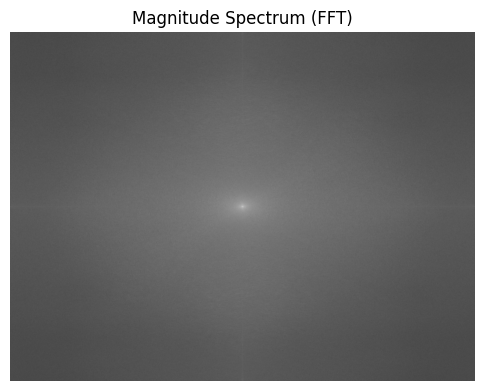

In [ ]:
#Displaying the Magnitude Spectrum
magnitude_spectrum = 20 * np.log(np.abs(fshift) + 1)  # +1 prevents log(0)

plt.figure(figsize=(6,6))
plt.imshow(magnitude_spectrum, cmap="gray")
plt.title("Magnitude Spectrum (FFT)")
plt.axis("off")

(np.float64(-0.5), np.float64(5183.5), np.float64(3887.5), np.float64(-0.5))

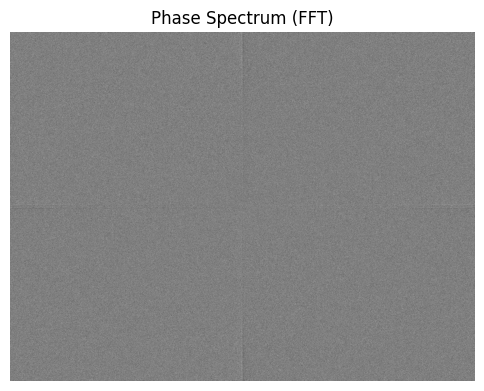

In [ ]:
#Displaying phase spectrum
plt.figure(figsize=(6,6))
plt.imshow(phase, cmap="gray")
plt.title("Phase Spectrum (FFT)")
plt.axis("off")

## Part C
### C1. Create 3 LPF masks

Radii of filter: 10, 30, 80 (or image-size dependent, mention if you change)

For each:

1. Create a mask

2. Apply to <code>fshift</code>

3. Reconstruct using <code>ifftshift + ifft2</code>

4. Show blur levels increasing as radius decreases ( think why and write reason in code comment )

### C2. Create HPF mask

1. Apply

2. Reconstruct

### C3. Create a square LPF mask
Keep side of square as 50. The square will be at the center of the filter.
Apply, Recontruct and show the output.

In [ ]:
# Your PART C codes follow here. You can create more cells under this. Write clean and commented code.

In [ ]:
#C1
rows, cols = gray_manual.shape
crow, ccol = rows//2, cols//2   # center coordinates

In [ ]:
def apply_lpf(radius):
    mask = np.zeros((rows, cols), np.uint8)

    # Creating a  circular mask centered at (crow, ccol)
    for i in range(rows):
        for j in range(cols):
            if np.sqrt((i-crow)**2 + (j-ccol)**2) <= radius:
                mask[i, j] = 1

    # Applying mask
    fshift_masked = fshift * mask

    # Reconstructing image
    f_ishift = np.fft.ifftshift(fshift_masked)
    img_back = np.fft.ifft2(f_ishift)
    img_back = np.abs(img_back)

    return img_back, mask

In [ ]:
#Applying LPF for radii: 10, 30, 80
radii = [10, 30, 80]
results_lpf = []

for r in radii:
    filtered_img, mask = apply_lpf(r)
    results_lpf.append((r, filtered_img))

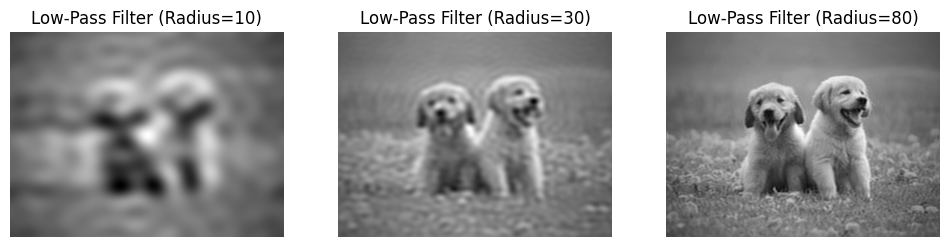

In [ ]:
plt.figure(figsize=(12,6))
for i, (r, img_back) in enumerate(results_lpf):
    plt.subplot(1,3,i+1)
    plt.imshow(img_back, cmap="gray")
    plt.title(f"Low-Pass Filter (Radius={r})")
    plt.axis("off")


In [ ]:
#As the radius of the low-pass filter decreases,
#more high-frequency components (edges and fine textures) are removed.
#This results in a smoother and blurrier image because the image retains only slow spatial variations.
#Therefore, a radius of 10 produces heavy blur,
#radius 30 produces moderate blur,
#and radius 80 retains more detail with mild smoothing.

In [ ]:
#C2
# Create HPF mask (remove center low-frequency region)
radius = 30
mask_hpf = np.ones((rows, cols), np.uint8)

for i in range(rows):
    for j in range(cols):
        if np.sqrt((i-crow)**2 + (j-ccol)**2) <= radius:
            mask_hpf[i, j] = 0

# Applying HPF
fshift_hpf = fshift * mask_hpf

# Reconstruct
f_ishift = np.fft.ifftshift(fshift_hpf)
img_hpf = np.fft.ifft2(f_ishift)
img_hpf = np.abs(img_hpf)

(np.float64(-0.5), np.float64(5183.5), np.float64(3887.5), np.float64(-0.5))

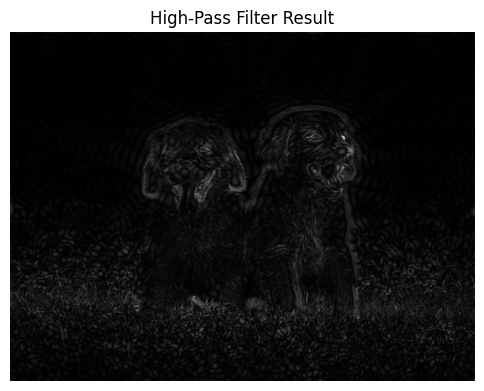

In [ ]:
#Displaying HPF results
plt.figure(figsize=(6,6))
plt.imshow(img_hpf, cmap='gray')
plt.title("High-Pass Filter Result")
plt.axis("off")

In [ ]:
#C3
#Square Low-Pass Filter
mask_square = np.zeros((rows, cols), np.uint8)

size = 50  # side length of square

mask_square[crow-size//2 : crow+size//2, ccol-size//2 : ccol+size//2] = 1

# Apply mask
fshift_square = fshift * mask_square

# Reconstruct
f_ishift = np.fft.ifftshift(fshift_square)
img_square = np.fft.ifft2(f_ishift)
img_square = np.abs(img_square)

(np.float64(-0.5), np.float64(5183.5), np.float64(3887.5), np.float64(-0.5))

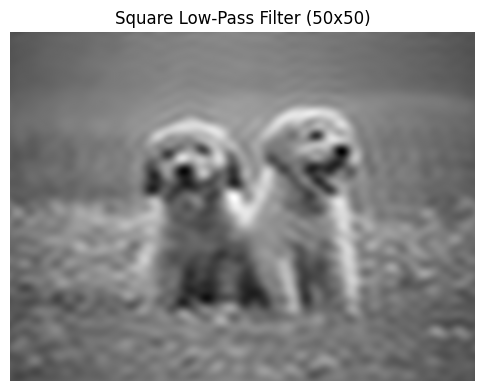

In [ ]:
#Displaying Square Low pass Filter results
plt.figure(figsize=(6,6))
plt.imshow(img_square, cmap="gray")
plt.title("Square Low-Pass Filter (50x50)")
plt.axis("off")

## Part D

###D1. Phase-only reconstruction

Use: <code>phase_only = fshift / np.abs(fshift)</code>

1. Reconstruct and display.
2. Also in code comments, mention the differnce between this code line and the one in the lecture : <code>np.angle(f_shift)</code>
3. Try recontruction from <code>np.angle(f_shift)</code> once and explain your output in code comments.



###D2. Magnitude-only reconstruction

Use: <code>mag_only = np.abs(fshift)</code>

1. Reconstruct and display.
2. Take a guess for the role of logarithm in Magnitude Spectrum. Why does this look different than what Magnitude Spectrum looked like ? Mention in code comments again.

In [ ]:
# Your PART D codes follow here. You can create more cells under this. Write clean and commented code.

In [40]:
imgi = cv2.imread("image6.jpg", 0).astype(np.float32)

# Compute FFT
F = np.fft.fft2(imgi)
FS = np.fft.fftshift(F)

#USING fshift / np.abs(fshift)
PO = FS / (np.abs(FS))
POS = np.fft.ifftshift(PO)
po_img = np.fft.ifft2(POS)
po_img = np.abs(po_img)

#USING np.angle(shift)
ang = np.angle(FS)
ang_img = np.abs(np.fft.ifft2(np.fft.ifftshift(ang)))

# In lecture: np.angle(shift) gives phase angles (real numbers).
# fshift / np.abs(fshift) gives complex numbers with unit magnitude (phase preserved).

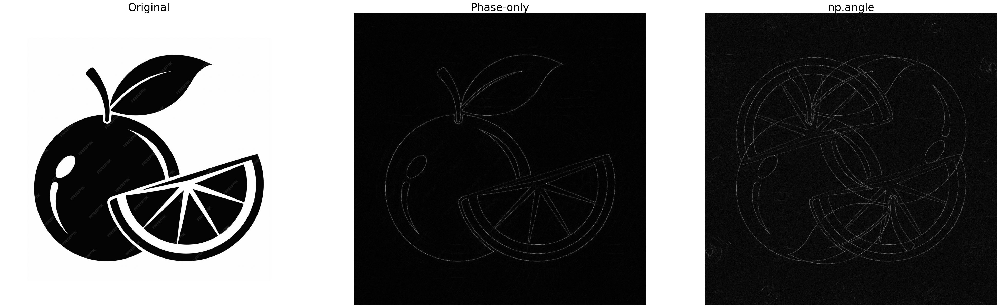

In [41]:
plt.figure(figsize=(50, 20))

plt.subplot(1,3,1)
plt.imshow(imgi, cmap='gray'), plt.title("Original", fontsize= 30), plt.axis("off")

plt.subplot(1,3,2)
plt.imshow(po_img, cmap='gray'), plt.title("Phase-only", fontsize= 30), plt.axis("off")

plt.subplot(1,3,3)
plt.imshow(ang_img, cmap='gray'), plt.title("np.angle", fontsize= 30), plt.axis("off")

# np.angle() returns phase angles (real numbers in radians).
# Feeding them directly to ifft2 does not reconstruct the image properly,
# because ifft2 expects complex numbers.
# The output appears mostly black.

plt.show()

In [ ]:
# Phase-only reconstruction keeps only the phase, which carries the image structure.
# Because the FFT of a real image is conjugate-symmetric, mirrored frequency contributions
# may overlap or separate depending on object placement and phase; this can produce either
# a single centered copy or multiple mirrored/ghosted copies in the reconstructed image.

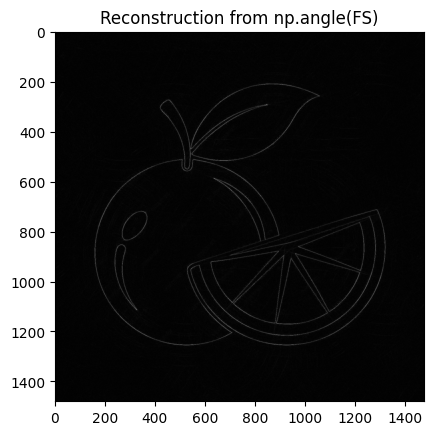

In [42]:
# Reconstruction using ONLY np.angle(FS)

# Extract only phase angles (real values in [-pi, pi])
ang = np.angle(FS)

# Convert angles back to complex phase representation.
# This step is IMPORTANT; directly feeding 'ang' to IFFT is wrong.
ang_complex = np.exp(1j * ang)

# Inverse FFT
ang_ifft = np.fft.ifft2(np.fft.ifftshift(ang_complex))

# Take magnitude
ang_img = np.abs(ang_ifft)


plt.imshow(ang_img, cmap='gray')
plt.title("Reconstruction from np.angle(FS)")
plt.show()

# Extract only phase angles (real values between -pi and +pi)
# This is different from FS / |FS| because np.angle(FS) returns ONLY the angle values,
# not a complex number. So we must convert back to a complex representation using exp(jθ).

# Convert phase angles back to a complex number on the unit circle.
# exp(1j * θ) = cos(θ) + i*sin(θ)
# This produces the SAME result as:  FS / |FS|
# Because both produce a unit-magnitude complex number with the same phase.

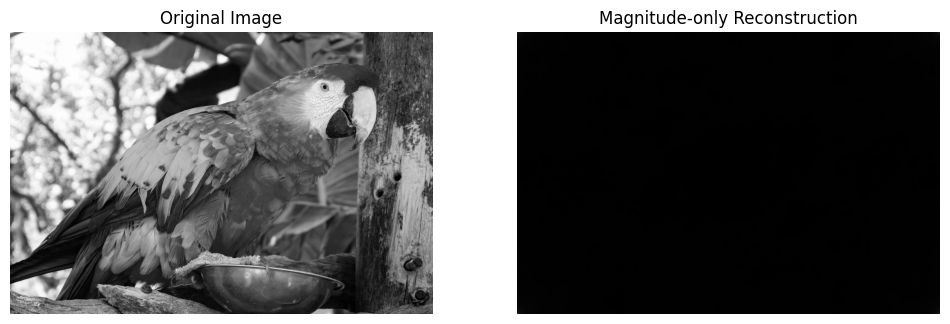

In [32]:
#D2
#Magnitude only Reconstruction
imgm = cv2.imread('image3.jpg', 0)

f = np.fft.fft2(imgm)
fshift = np.fft.fftshift(f)

mag_only = np.abs(fshift)

reconstructed_mag_only = np.fft.ifft2(np.fft.ifftshift(mag_only)).real

plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
plt.imshow(imgm, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(reconstructed_mag_only, cmap='gray')
plt.title('Magnitude-only Reconstruction')
plt.axis('off')
plt.show()

In [ ]:
# 1. mag_only = np.abs(fshift) → keeps magnitude, discards phase
# 2. Image looks blurry/blank because phase has most structural info
# 3. Log in magnitude spectrum is for visualization only; raw magnitude used here

## Bonus - Part E

Load another image as you did before. Then swap magnitude and phase between them. In other words, for both images, find the magnitudes and phases. Combine magnitude of image 1 with phase of image 2. Also combine magnitude of 2 with phase of 1. Then reconstruct and display the resultant images.

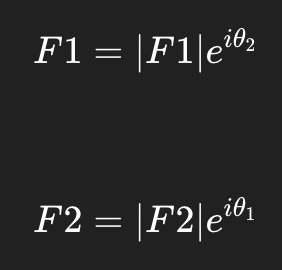

Do you notice how phase describes structure and magnitude describes texture of image ? Mention at last in code comments.


In [ ]:
# Your PART E codes follow here. You can create more cells under this. Write clean and commented code.

In [ ]:
imgA = cv2.imread("image.jpg", cv2.IMREAD_GRAYSCALE)
imgB = cv2.imread("image2.jpg", cv2.IMREAD_GRAYSCALE)

# Resize second image to match first
imgB = cv2.resize(imgB, (imgA.shape[1], imgA.shape[0]))

fftA = np.fft.fftshift(np.fft.fft2(imgA))
fftB = np.fft.fftshift(np.fft.fft2(imgB))

# Magnitude and Phase
magA = np.abs(fftA)
phaseA = np.angle(fftA)

magB = np.abs(fftB)
phaseB = np.angle(fftB)

# Combine magnitude of A with phase of B
comboA_magB_phase = magA * np.exp(1j * phaseB)

# Combine magnitude of B with phase of A
comboB_magA_phase = magB * np.exp(1j * phaseA)

# INVERSE FFT + RECONSTRUCT
comboA_image = np.fft.ifft2(np.fft.ifftshift(comboA_magB_phase))
comboB_image = np.fft.ifft2(np.fft.ifftshift(comboB_magA_phase))

# Convert to real values
comboA_image = np.abs(comboA_image)
comboB_image = np.abs(comboB_image)

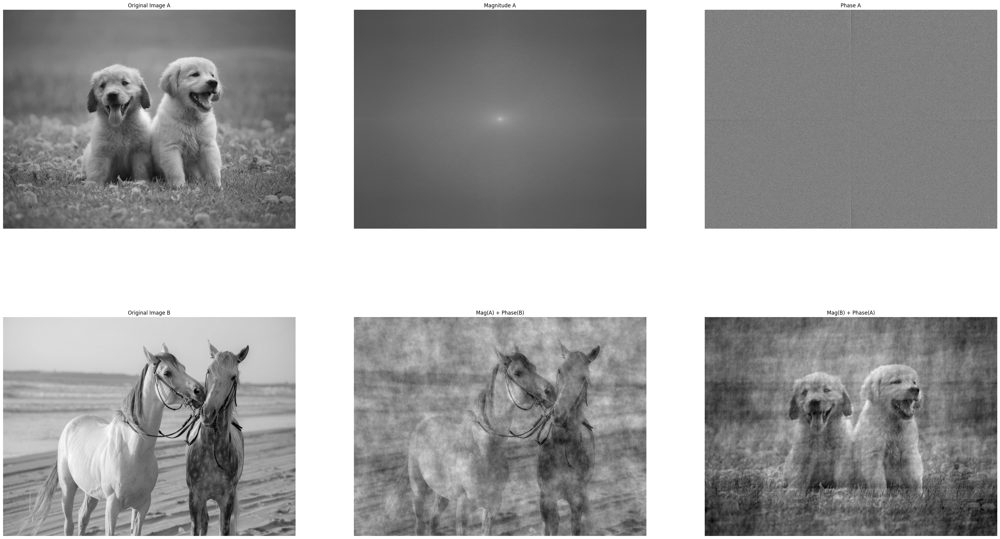

In [ ]:
plt.figure(figsize=(42, 24))

plt.subplot(2, 3, 1), plt.imshow(imgA, cmap='gray'), plt.title("Original Image A"), plt.axis('off')
plt.subplot(2, 3, 2), plt.imshow(np.log(1+magA), cmap='gray'), plt.title("Magnitude A"), plt.axis('off')
plt.subplot(2, 3, 3), plt.imshow(phaseA, cmap='gray'), plt.title("Phase A"), plt.axis('off')

plt.subplot(2, 3, 4), plt.imshow(imgB, cmap='gray'), plt.title("Original Image B"), plt.axis('off')
plt.subplot(2, 3, 5), plt.imshow(comboA_image, cmap='gray'), plt.title("Mag(A) + Phase(B)"), plt.axis('off')
plt.subplot(2, 3, 6), plt.imshow(comboB_image, cmap='gray'), plt.title("Mag(B) + Phase(A)"), plt.axis('off')

plt.show()

In [ ]:
#We notice that the images mainly keep the shape, outlines, and structure
#of the image whose PHASE was used.

# PHASE carries the important structural and spatial information of the image (edges, objects, shapes).
# MAGNITUDE mainly controls brightness, intensity distribution, and texture.

#That’s why swapping magnitude and phase results in images that look like thephase donor, not the magnitude donor.